# Ultimate Challenge - Springboard take-home challenge

## Part 1: EDA



### Load packages

In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import numpy as np
import sklearn
import datetime
import seaborn as sns
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

import sklearn
from sklearn import metrics
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import GridSearchCV

### Load the data

In [2]:
# Load dataset
json_data = pd.read_json('logins.json')
json_data.head()

,login_time
0,1970-01-01 20:13:18
1,1970-01-01 20:16:10
2,1970-01-01 20:16:37
3,1970-01-01 20:16:36
4,1970-01-01 20:26:21


In [3]:
json_data.dtypes

login_time    datetime64[ns]
dtype: object

In [4]:
json_data.describe()

,login_time
count,93142
unique,92265
top,1970-02-12 11:16:53
freq,3
first,1970-01-01 20:12:16
last,1970-04-13 18:57:38


In [5]:
json_data.isna().sum()

login_time    0
dtype: int64

### Find patterns over 3 months

Let's aggregate the data by 15min intervals, then create a heatmap to see if there is a daily pattern.

In [6]:
# Create a column with the number of users
json_data['users'] = 1

In [7]:
# Aggregate by 15-min intervals
grouped_data= json_data.groupby(pd.Grouper(key = 'login_time', freq="15min")).count()
grouped_data= grouped_data.reset_index()
grouped_data.head()

,login_time,users
0,1970-01-01 20:00:00,2
1,1970-01-01 20:15:00,6
2,1970-01-01 20:30:00,9
3,1970-01-01 20:45:00,7
4,1970-01-01 21:00:00,1


In [8]:
# Parse the date and time for plotting and heatmap
grouped_data['time'] = grouped_data.login_time.dt.time
grouped_data['date'] = grouped_data.login_time.dt.date
grouped_data.drop('login_time', axis = 1, inplace= True)
grouped_data.head()

,users,time,date
0,2,20:00:00,1970-01-01
1,6,20:15:00,1970-01-01
2,9,20:30:00,1970-01-01
3,7,20:45:00,1970-01-01
4,1,21:00:00,1970-01-01


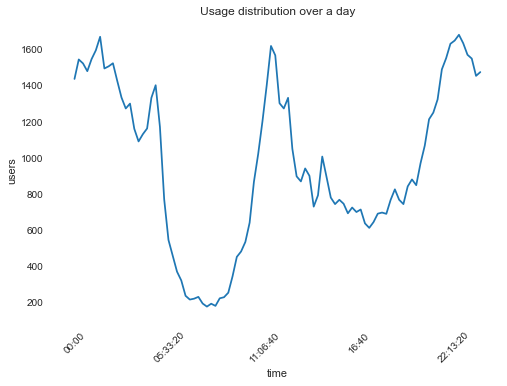

In [9]:
# Plot the usage throughout a day
plt.plot(grouped_data.groupby('time').sum())
plt.xlabel('time')
plt.ylabel('users')
plt.xticks(rotation=45)
plt.title('Usage distribution over a day')
plt.show()

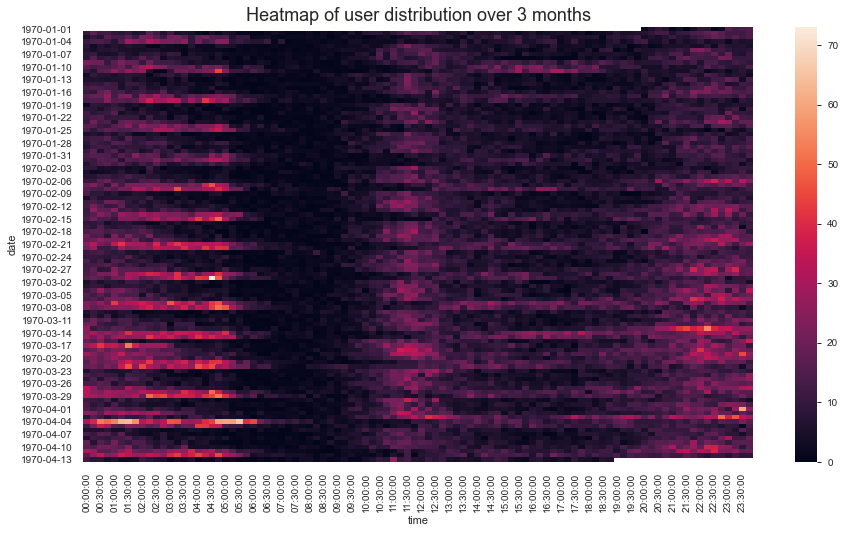

In [10]:
# Make a heatmap
heatmap =grouped_data.pivot("date", "time", "users")
#heatmap.head()
plt.figure(figsize=(15,8))
sns.heatmap(heatmap)
plt.title('Heatmap of user distribution over 3 months', size = 18)
plt.show()

The light vertical stripes indicate that there is higher demand between 10 am and 12:30 am, then between 9 pm and 5 am.
We also see horizontal stripes, maybe there is a pattern between weekdays and weekend?
There seems to be an increase in use over the months, which we could confirm by plotting the data aggregated by days.

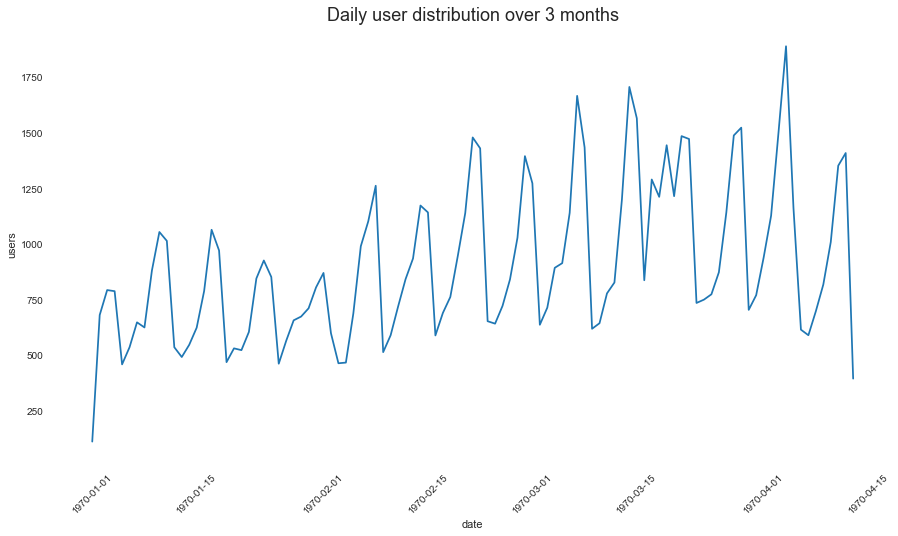

In [11]:
plt.figure(figsize=(15,8))
plt.plot(grouped_data.groupby('date').sum())
plt.xlabel('date')
plt.ylabel('users')
plt.xticks(rotation=45)
plt.title('Daily user distribution over 3 months', size = 18)
plt.show()

The plot above confirms the presence of weekly variations, and the overall increase in usage over the 3 months.

### Find patterns between weekdays

In [12]:
# Same idea with weekdays: aggregate by 15 min
weekday_data= json_data.groupby(pd.Grouper(key = 'login_time', freq="15min")).count()
weekday_data['weekday']= weekday_data.index.weekday

weekday_data= weekday_data.reset_index()
weekday_data.head()

,login_time,users,weekday
0,1970-01-01 20:00:00,2,3
1,1970-01-01 20:15:00,6,3
2,1970-01-01 20:30:00,9,3
3,1970-01-01 20:45:00,7,3
4,1970-01-01 21:00:00,1,3


In [13]:
dayOfWeek={0:'Monday', 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday', 6:'Sunday'}

# I had to order the weekdays so seaborn would display the days in logical order, not alphabetical
cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
cat_type = pd.api.types.CategoricalDtype(categories=cats, ordered=True)

weekday_data['weekday'] = weekday_data['weekday'].map(dayOfWeek).astype(cat_type)
weekday_data.head()

,login_time,users,weekday
0,1970-01-01 20:00:00,2,Thursday
1,1970-01-01 20:15:00,6,Thursday
2,1970-01-01 20:30:00,9,Thursday
3,1970-01-01 20:45:00,7,Thursday
4,1970-01-01 21:00:00,1,Thursday


In [14]:
# Extract the time and get rid of the whole timestamp
weekday_data['time'] = weekday_data.login_time.dt.time
weekday_data.drop('login_time', axis = 1, inplace = True)

In [15]:
# Group again by weekday (and time so we don't loose that info)
weekday_data = weekday_data.groupby(['weekday', 'time']).sum()
weekday_data.head()

users
weekday time           
Monday  00:00:00    126
        00:15:00    140
        00:30:00    144
        00:45:00    121
        01:00:00    109

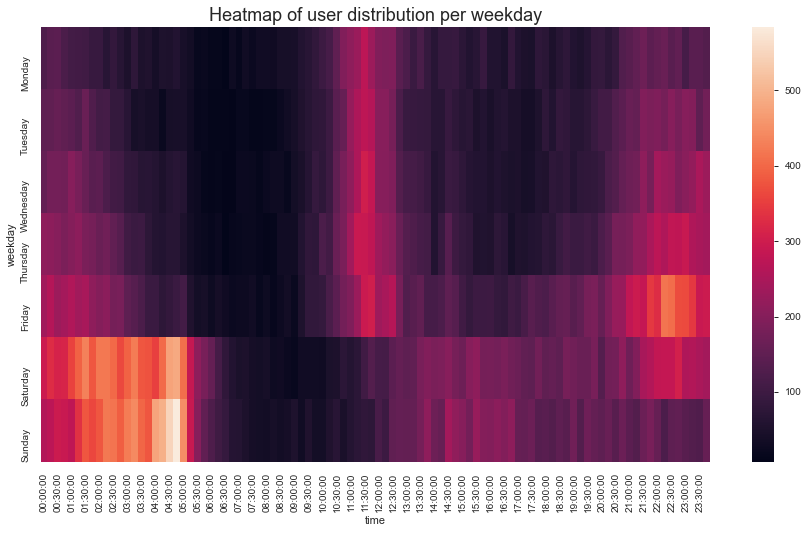

In [16]:
heatmap =weekday_data.unstack()
heatmap.columns = heatmap.columns.droplevel()

plt.figure(figsize=(15,8))
sns.heatmap(heatmap)
plt.title('Heatmap of user distribution per weekday', size = 18)
plt.show()

The heatmap indicates a different pattern for business days and weekend days: 
* On weekends, the demand is high early in the morning (midnight to 5:15 am), then drops until 12 am. Demand then increases slowly until it peaks again at 12 pm.
* On business days, demand peaks around noon and increases again late at night (after 9 pm). 
* Friday night is the busiest night, followed by Thursday and Saturday night
* Demand is higher on weekends, with peaks at 600 users

In [17]:
plot_weekday = weekday_data.reset_index()
plot_weekday.head()

,weekday,time,users
0,Monday,00:00:00,126
1,Monday,00:15:00,140
2,Monday,00:30:00,144
3,Monday,00:45:00,121
4,Monday,01:00:00,109


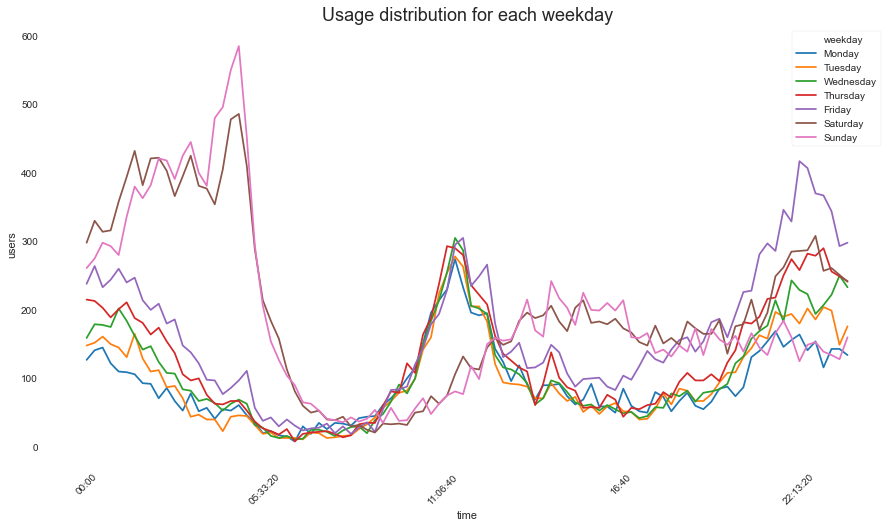

In [18]:
# Plot the usage throughout weekdays
plt.figure(figsize=(15,8))
sns.lineplot(x ='time', y='users', data = plot_weekday, hue='weekday' )
plt.xlabel('time')
plt.ylabel('users')
plt.xticks(rotation=45)
plt.title('Usage distribution for each weekday', size = 18)
plt.legend(loc='upper right')
plt.show()

This other way to visualize the distribution between weekdays confirms the observations made from the heat map.

We did not find any issues with the data.

## Part 2: Experiment and metrics design

We want to use **A/B testing** to see if the incentive (reimbursing toll costs) helps solve the problem (drivers working in one city only).

The metric I recommend to use is the *percent of rides in the other city* (if the driver is from Gotham, it's Metropolis, and vice-versa). A successful program would result in an increase of the percentage compared to the control.
This is the simplest metric to use, but it does not indicate if the program is profitable (that would be the next step: comparing the costs of reimbursing the toll with the increase in revenue from the program).

### A/B testing step-by-step

0. **Pick the variable to test and identify the goal**

The variable was defined in the problem: the treatment would include toll reimbursement for drivers. The goal is to increase the percentage of rides in the other city.

1. **Assign a proportion of drivers to the treatment**

The main assumption of A/B testing is that before treatement the groups are the same. Therefore, we need a stratified split between the two cities. Besides the city, we want the split to be random. The size of the treatment group should be large enough to make the experiment statistically significant (but not too large as to drive the costs up), ideally 50% of drivers.

2. **Decide the sample size (duration of the experiment)**

We need to collect enough data for the results to be significant. The duration will be based on the split, average number of daily rides and desired significance level.

3. **Make sure the metrics and other useful data is recorded, and create tools to monitor the experiment**

4. **Run the experiment for enough time**

5. **Check metric, significance of results and take action**

## Part 3: Predictive modeling

### Load the data

In [19]:
# Load dataset
import json
with open('ultimate_data_challenge.json', 'r') as file:
    data = json.load(file)
model_data = pd.DataFrame(data)
model_data.head()

,city,trips_in_first_30_days,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver
0,King's Landing,4,2014-01-25,4.7,1.10,2014-06-17,iPhone,15.4,True,46.2,3.67,5.0
1,Astapor,0,2014-01-29,5.0,1.00,2014-05-05,Android,0.0,False,50.0,8.26,5.0
2,Astapor,3,2014-01-06,4.3,1.00,2014-01-07,iPhone,0.0,False,100.0,0.77,5.0
3,King's Landing,9,2014-01-10,4.6,1.14,2014-06-29,iPhone,20.0,True,80.0,2.36,4.9
4,Winterfell,14,2014-01-27,4.4,1.19,2014-03-15,Android,11.8,False,82.4,3.13,4.9


### EDA

In [20]:
model_data.dtypes

city                       object
trips_in_first_30_days      int64
signup_date                object
avg_rating_of_driver      float64
avg_surge                 float64
last_trip_date             object
phone                      object
surge_pct                 float64
ultimate_black_user          bool
weekday_pct               float64
avg_dist                  float64
avg_rating_by_driver      float64
dtype: object

In [21]:
model_data.describe()

,trips_in_first_30_days,avg_rating_of_driver,avg_surge,surge_pct,weekday_pct,avg_dist,avg_rating_by_driver
count,50000.000000,41878.000000,50000.000000,50000.000000,50000.000000,50000.000000,49799.000000
mean,2.278200,4.601559,1.074764,8.849536,60.926084,5.796827,4.778158
std,3.792684,0.617338,0.222336,19.958811,37.081503,5.707357,0.446652
min,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,4.300000,1.000000,0.000000,33.300000,2.420000,4.700000
50%,1.000000,4.900000,1.000000,0.000000,66.700000,3.880000,5.000000
75%,3.000000,5.000000,1.050000,8.600000,100.000000,6.940000,5.000000
max,125.000000,5.000000,8.000000,100.000000,100.000000,160.960000,5.000000


In [22]:
ProfileReport(model_data)

Based on this quick exploration, here are the things we need to do:
* Convert dates to datetime objects
* Identify active users (trip taken in the preceding 30 days) and create the label column
* Address NA values for the two rating variables (16.2% of missing 'average_rating_of_driver', 0.2% missing of 'average_rating_by_driver'). We will fill with the average rating

In [23]:
clean_df = model_data.copy()

In [24]:
# Dates to datetime
clean_df['signup_date'] = pd.to_datetime(clean_df['signup_date'])
clean_df['last_trip_date'] = pd.to_datetime(clean_df['last_trip_date'])
assert clean_df['signup_date'].dtypes == 'datetime64[ns]'
assert clean_df['last_trip_date'].dtypes == 'datetime64[ns]'

In [25]:
# Add label column
pull_day = pd.Timestamp(datetime.date(2014, 7, 1))
delta = datetime.timedelta(days=30)
active_cut_date = pull_day - delta
clean_df['is_active'] = clean_df['last_trip_date'] > active_cut_date
clean_df['is_active'] = clean_df['is_active'].astype(int)
clean_df.head()

,city,trips_in_first_30_days,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver,is_active
0,King's Landing,4,2014-01-25,4.7,1.10,2014-06-17,iPhone,15.4,True,46.2,3.67,5.0,1
1,Astapor,0,2014-01-29,5.0,1.00,2014-05-05,Android,0.0,False,50.0,8.26,5.0,0
2,Astapor,3,2014-01-06,4.3,1.00,2014-01-07,iPhone,0.0,False,100.0,0.77,5.0,0
3,King's Landing,9,2014-01-10,4.6,1.14,2014-06-29,iPhone,20.0,True,80.0,2.36,4.9,1
4,Winterfell,14,2014-01-27,4.4,1.19,2014-03-15,Android,11.8,False,82.4,3.13,4.9,0


In [26]:
# Replace NA by average in the two rating columns
clean_df['avg_rating_of_driver'].fillna(clean_df['avg_rating_of_driver'].mean(), inplace = True)
clean_df['avg_rating_by_driver'].fillna(clean_df['avg_rating_by_driver'].mean(), inplace = True)

In [27]:
ProfileReport(clean_df)

In [28]:
print("Percentage of active users: ",np.round(clean_df['is_active'].sum()/len(clean_df)*100,1), "%")

Percentage of active users:  36.6 %


We have addressed the concerns identified during EDA. The 8 duplicate rows will be left untouched since we are dealing with simulated data. 

We continue the EDA with pairs plot to identify trends in the data, but the correlation matrices of ProfileReports already showed some correlation between the user activity and 'trips_in_first_30_days', 'avg_surge', 'surge_pct', 'ultimate_black_user' and 'avg_rating_by_user' (negative correlation).

In [29]:
clean_df['ultimate_black_user'] = clean_df['ultimate_black_user'].astype(int)

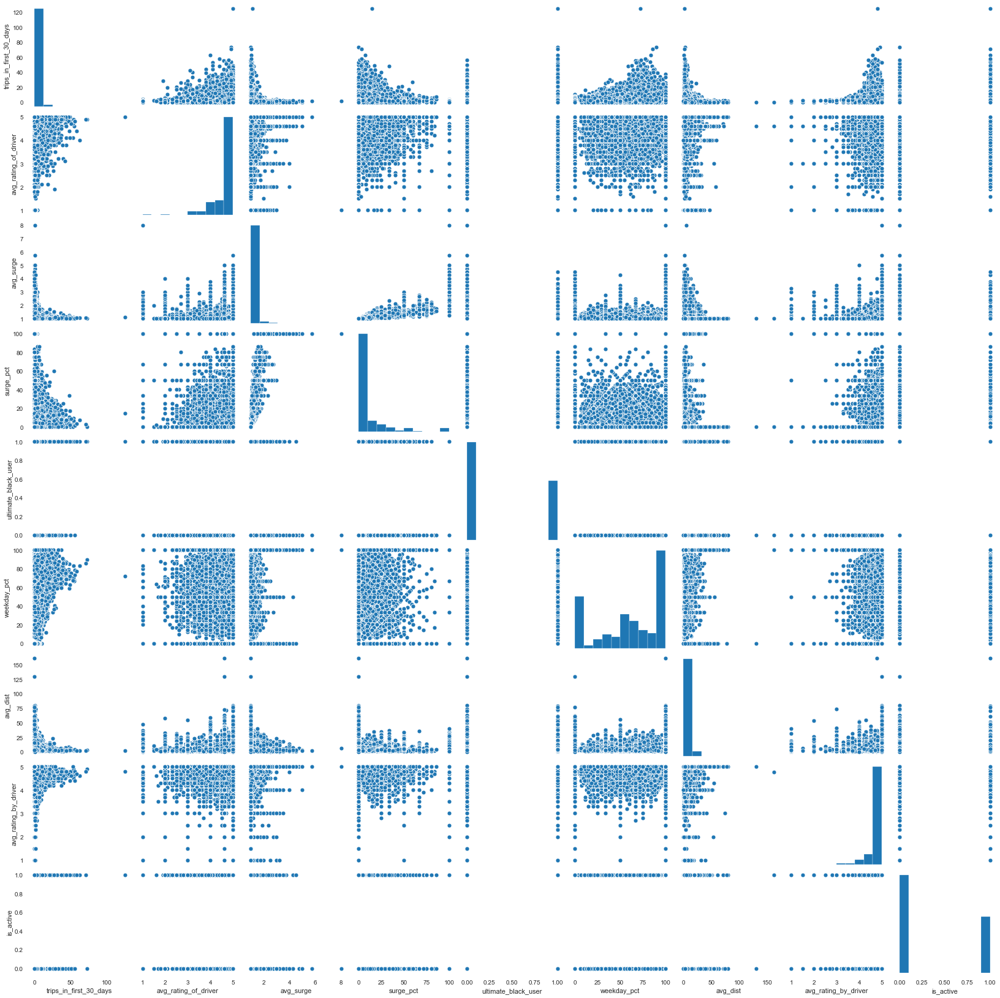

In [30]:
sns.pairplot(clean_df)
plt.show()

In [31]:
clean_df['is_active'].astype(int)

0        1
1        0
2        0
3        1
4        0
        ..
49995    1
49996    0
49997    0
49998    0
49999    0
Name: is_active, Length: 50000, dtype: int32

### Build a predictive model

First we will try a logistic regression.

In [32]:
categorical = ['city', 'phone']

In [33]:
X = clean_df.drop('is_active', axis =1)
y = clean_df.is_active

In [34]:
# Make dummy variable for all categorical variables
for var in categorical:
    dummy = pd.get_dummies(X[str(var)])
    col_dict = {}
    for i in dummy.columns:
        col_dict[i] = str(var) + "-" + str(i)
    dummy = dummy.rename(columns=col_dict)
    dummy = dummy.drop(columns=dummy.columns[0])
    X = pd.concat([X, dummy], axis = 1)
    X = X.drop(var, axis =1)
X.head()

,trips_in_first_30_days,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver,city-King's Landing,city-Winterfell,phone-iPhone
0,4,2014-01-25,4.7,1.10,2014-06-17,15.4,1,46.2,3.67,5.0,1,0,1
1,0,2014-01-29,5.0,1.00,2014-05-05,0.0,0,50.0,8.26,5.0,0,0,0
2,3,2014-01-06,4.3,1.00,2014-01-07,0.0,0,100.0,0.77,5.0,0,0,1
3,9,2014-01-10,4.6,1.14,2014-06-29,20.0,1,80.0,2.36,4.9,1,0,1
4,14,2014-01-27,4.4,1.19,2014-03-15,11.8,0,82.4,3.13,4.9,0,1,0


In [35]:
# Change dates to numeric variables: I chose to do the difference in days with Jan 1 

day_zero = pd.Timestamp(datetime.date(2014, 1, 1))
X['signup_delta'] = ((clean_df['signup_date']-day_zero).dt.days).astype(int)
X.drop(['last_trip_date', 'signup_date'], axis = 1, inplace = True)
X.head()



,trips_in_first_30_days,avg_rating_of_driver,avg_surge,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver,city-King's Landing,city-Winterfell,phone-iPhone,signup_delta
0,4,4.7,1.10,15.4,1,46.2,3.67,5.0,1,0,1,24
1,0,5.0,1.00,0.0,0,50.0,8.26,5.0,0,0,0,28
2,3,4.3,1.00,0.0,0,100.0,0.77,5.0,0,0,1,5
3,9,4.6,1.14,20.0,1,80.0,2.36,4.9,1,0,1,9
4,14,4.4,1.19,11.8,0,82.4,3.13,4.9,0,1,0,26


In [36]:
# Split into train and test sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state= 2, 
                                                    stratify = y)

In [37]:
# This creates a LogisticRegression object
from sklearn.linear_model import LogisticRegression

lg = LogisticRegression()
lg.fit(X_train, y_train)

C:\Users\beren\anaconda3\envs\TensorFlow-GPU\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [38]:
#Predict labels and probabilities of test set
predictions = lg.predict(X_test)
proba = lg.predict_proba(X_test)
# Assess performance: ROC and AUC
fpr, tpr, _ = metrics.roc_curve(y_test, proba[:,1])
auc = metrics.auc(fpr, tpr)
print('Area under ROC =', np.round(auc, 2))

Area under ROC = 0.76


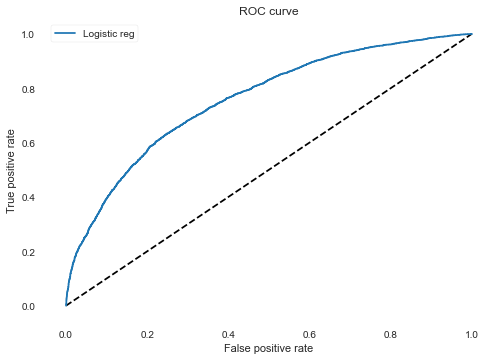

In [39]:
#Plot ROC
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='Logistic reg')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

Confusion matrix:  [[5426  912]
 [1911 1751]]


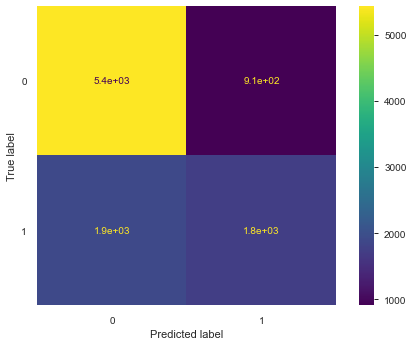

In [40]:
#Confusion matrix
confusion_matrix = metrics.confusion_matrix(y_test, predictions)
print('Confusion matrix: ', confusion_matrix)
metrics.plot_confusion_matrix(lg, X_test, y_test)

In [41]:
precision = metrics.precision_score(y_test, predictions)
print('Precision : {0:0.3f}'.format(precision))
print('Recall :', np.round(metrics.recall_score(y_test, predictions),3))
print('Accuracy : ',np.round(metrics.accuracy_score(y_test, predictions),3))

Precision : 0.658
Recall : 0.478
Accuracy :  0.718


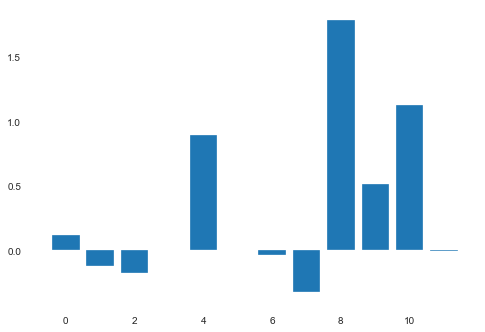

In [42]:
# get coefficients to assess feature importance
importance = lg.coef_
plt.bar([x for x in range(len(importance[0]))], importance[0])
plt.show()

In [43]:
# We get a better idea of the feature importance if we multiply the coefficients by the std dev of the feature
print(np.std(X, 0)*importance[0])

trips_in_first_30_days    0.452304
avg_rating_of_driver     -0.066805
avg_surge                -0.038151
surge_pct                 0.076084
ultimate_black_user       0.432410
weekday_pct               0.019564
avg_dist                 -0.221453
avg_rating_by_driver     -0.142712
city-King's Landing       0.718674
city-Winterfell           0.255522
phone-iPhone              0.520748
signup_delta             -0.064252
dtype: float64


Area under ROC of 0.76 is not bad for a first model, but can probably do better. Let's try kNN then a random forest

### kNN

In [44]:
# Standardize the dataset
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X_train)
standardized_X = scaler.transform(X_train)
standardized_X_test = scaler.transform(X_test)

In [45]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
knn = KNeighborsClassifier()
grid_parameters = {'n_neighbors': [5,11,19], 'weights': ['uniform', 'distance']}
searcher= GridSearchCV(knn, grid_parameters, verbose = 1, cv = 3, n_jobs = 4)
knnB = searcher.fit(standardized_X, y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  18 out of  18 | elapsed:   12.4s finished


In [46]:
# Report the best parameters and the corresponding score
print("Best CV params", searcher.best_params_)
print("Best CV accuracy", searcher.best_score_)

# Report the test accuracy using these best parameters
print("Test accuracy of best grid search hypers:", searcher.score(standardized_X_test, y_test))

Best CV params {'n_neighbors': 19, 'weights': 'uniform'}
Best CV accuracy 0.7609500609496639
Test accuracy of best grid search hypers: 0.758


In [47]:
knn = KNeighborsClassifier(n_neighbors= 19, weights= 'uniform' , n_jobs = -1)
knn.fit(standardized_X, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=19, p=2,
                     weights='uniform')

In [48]:
#Predict labels and probabilities of test set
predictions = knn.predict(standardized_X_test)
proba = knn.predict_proba(standardized_X_test)
# Assess performance: ROC and AUC
fpr, tpr, _ = metrics.roc_curve(y_test, proba[:,1])
# Assess performance: ROC and AUC
fpr, tpr, _ = metrics.roc_curve(y_test, proba[:,1])
auc = metrics.auc(fpr, tpr)
print('Area under ROC =', np.round(auc, 2))

Area under ROC = 0.81


This is better, let's try a RF

### Random Forest

In [49]:
from sklearn.ensemble import RandomForestClassifier

# Create and fit the classifier
rf = RandomForestClassifier(verbose = 1, n_jobs = -1)
rf.fit(standardized_X, y_train)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.3s finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=1,
                       warm_start=False)

In [50]:
# Prediction test labels
predictions = rf.predict(standardized_X_test)
proba = rf.predict_proba(standardized_X_test)
# Assess performance: ROC and AUC
fpr, tpr, _ = metrics.roc_curve(y_test, proba[:,1])
# Assess performance: ROC and AUC
fpr, tpr, _ = metrics.roc_curve(y_test, proba[:,1])
auc = metrics.auc(fpr, tpr)
print('Area under ROC =', np.round(auc, 2))


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Area under ROC = 0.84


Area under ROC = 0.84


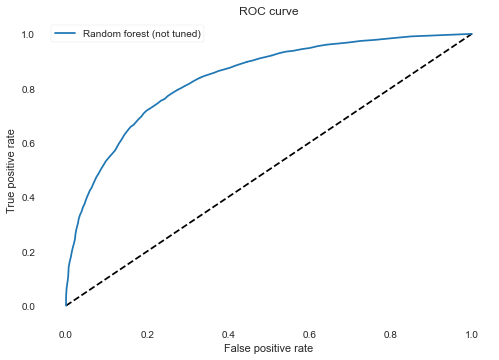

In [51]:
#Plot ROC
fpr, tpr, _ = metrics.roc_curve(y_test, proba[:,1])
auc = metrics.auc(fpr, tpr)
print('Area under ROC =', np.round(auc, 2))

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='Random forest (not tuned)')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

RF confusion matrix:  [[5388  950]
 [1315 2347]]


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


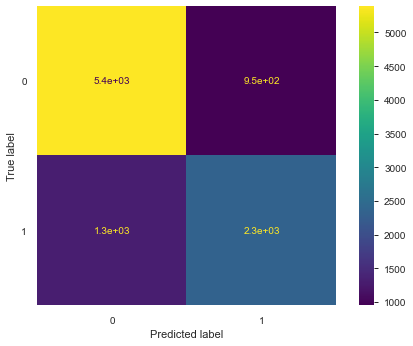

In [52]:
# Confusion matrix
confusion_matrix = metrics.confusion_matrix(y_test, predictions)
print('RF confusion matrix: ', confusion_matrix)
metrics.plot_confusion_matrix(rf, standardized_X_test, y_test)

In [53]:
# Print precision, recall and accuracy score
print('Precision : {0:0.3f}'.format(metrics.precision_score(y_test, predictions)))
print('Recall :', np.round(metrics.recall_score(y_test, predictions),3))
print('Accuracy : ',np.round(metrics.accuracy_score(y_test, predictions),3))

Precision : 0.712
Recall : 0.641
Accuracy :  0.774


These results are even better. We will now tune the hyperparameters

### RF - Tuned Hyperparameters

In [54]:
forest = RandomForestClassifier()
n_estimators = [100, 500, 1200]
max_depth = [5, 15, 30]
min_samples_split = [2, 10, 100]
min_samples_leaf = [1, 2, 5, 10] 

hyperF = dict(n_estimators = n_estimators, max_depth = max_depth,  
              min_samples_split = min_samples_split, 
             min_samples_leaf = min_samples_leaf)

gridF = GridSearchCV(forest, hyperF, cv = 3, verbose = 1, 
                      n_jobs = -1)

In [55]:
gridF.fit(standardized_X, y_train)
gridF.best_params_

Fitting 3 folds for each of 108 candidates, totalling 324 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   23.9s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 324 out of 324 | elapsed:  6.2min finished


{'max_depth': 15,
 'min_samples_leaf': 5,
 'min_samples_split': 10,
 'n_estimators': 1200}

In [56]:
forest = RandomForestClassifier(max_depth= 15, min_samples_leaf= 2, min_samples_split= 10, 
           n_estimators = 100, verbose = 1, n_jobs = -1)
forest.fit(standardized_X, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.3s finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=1,
                       warm_start=False)

In [57]:
# Prediction test labels
predictions = forest.predict(standardized_X_test)
proba = forest.predict_proba(standardized_X_test)
# Assess performance: ROC and AUC
fpr, tpr, _ = metrics.roc_curve(y_test, proba[:,1])
# Assess performance: ROC and AUC
fpr, tpr, _ = metrics.roc_curve(y_test, proba[:,1])
auc = metrics.auc(fpr, tpr)
print('Area under ROC =', np.round(auc, 2))

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Area under ROC = 0.85


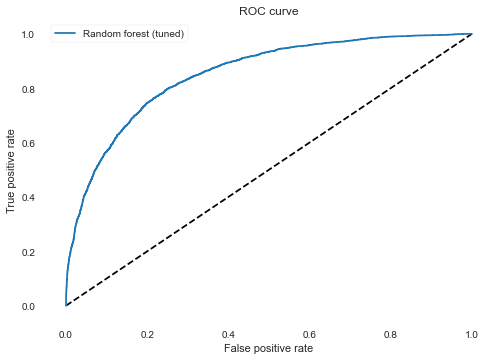

In [58]:
#Plot ROC
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='Random forest (tuned)')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

RF confusion matrix:  [[5476  862]
 [1314 2348]]


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


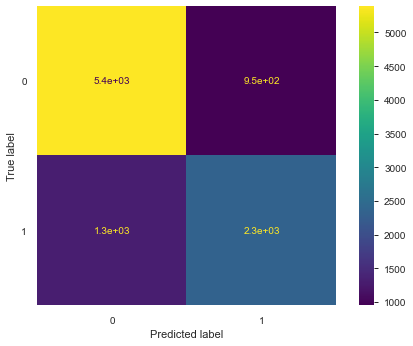

In [59]:
# Confusion matrix
confusion_matrix = metrics.confusion_matrix(y_test, predictions)
print('RF confusion matrix: ', confusion_matrix)
metrics.plot_confusion_matrix(rf, standardized_X_test, y_test)

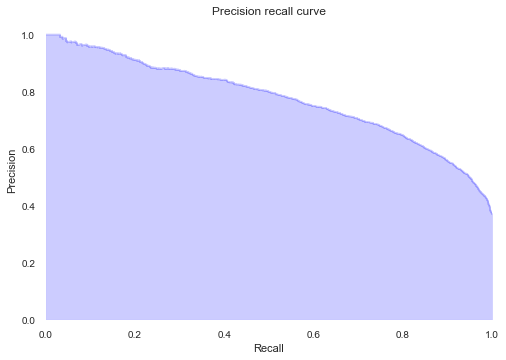

In [60]:
# Plot precision recall curve
precision, recall, thresholds = metrics.precision_recall_curve(y_test, proba[:,1])
plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision recall curve')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0]) 
plt.show()

In [61]:
# Print precision, recall and accuracy score
print('Precision : {0:0.3f}'.format(metrics.precision_score(y_test, predictions)))
print('Recall :', np.round(metrics.recall_score(y_test, predictions),3))
print('Accuracy : ',np.round(metrics.accuracy_score(y_test, predictions),3))

Precision : 0.731
Recall : 0.641
Accuracy :  0.782


### Feature importance

In [62]:
# List of features for later use
feature_list = list(X.columns)
# Get numerical feature importances
importances = list(forest.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 4)) for feature, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances]

Variable: avg_rating_by_driver Importance: 0.144
Variable: weekday_pct          Importance: 0.1273
Variable: surge_pct            Importance: 0.1137
Variable: city-King's Landing  Importance: 0.1094
Variable: avg_dist             Importance: 0.1069
Variable: avg_surge            Importance: 0.081
Variable: signup_delta         Importance: 0.0721
Variable: trips_in_first_30_days Importance: 0.0659
Variable: phone-iPhone         Importance: 0.0622
Variable: ultimate_black_user  Importance: 0.0513
Variable: avg_rating_of_driver Importance: 0.0496
Variable: city-Winterfell      Importance: 0.0166


[None, None, None, None, None, None, None, None, None, None, None, None]

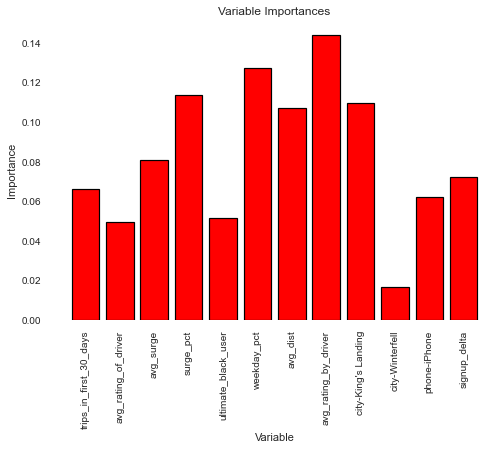

In [63]:
# list of x locations for plotting
x_values = list(range(len(importances)))
# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical', color = 'r', edgecolor = 'k', linewidth = 1.2)
# Tick labels for x axis
plt.xticks(x_values, feature_list, rotation='vertical')
# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

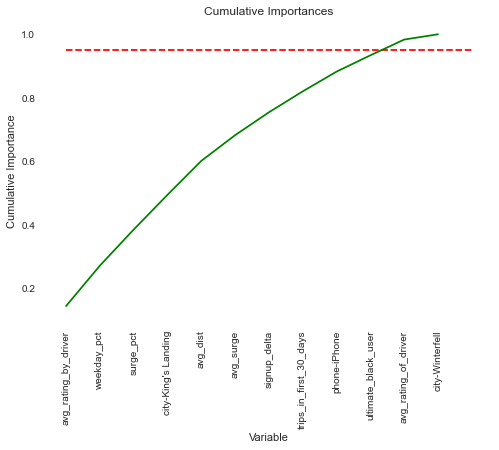

In [64]:
# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances]
sorted_features = [importance[0] for importance in feature_importances]
# Cumulative importances
cumulative_importances = np.cumsum(sorted_importances)
# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')
# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')
# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')
# Axis labels and title
plt.xlabel('Variable'); plt.ylabel('Cumulative Importance'); plt.title('Cumulative Importances');

### XGBoost

In [65]:
from xgboost import XGBClassifier

model = XGBClassifier()
model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
              validate_parameters=False, verbosity=None)

In [66]:
# Prediction test labels
predictions = model.predict(X_test)
proba = model.predict_proba(X_test)
# Assess performance: ROC and AUC
fpr, tpr, _ = metrics.roc_curve(y_test, proba[:,1])
# Assess performance: ROC and AUC
fpr, tpr, _ = metrics.roc_curve(y_test, proba[:,1])
auc = metrics.auc(fpr, tpr)
print('Area under ROC =', np.round(auc, 2))

Area under ROC = 0.85


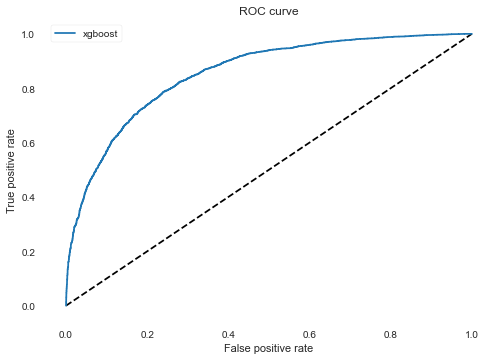

In [67]:
#Plot ROC
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='xgboost')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

RF confusion matrix:  [[5446  892]
 [1260 2402]]


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


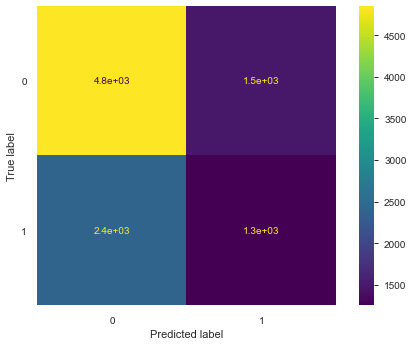

In [68]:
# Confusion matrix
confusion_matrix = metrics.confusion_matrix(y_test, predictions)
print('RF confusion matrix: ', confusion_matrix)
metrics.plot_confusion_matrix(rf, X_test, y_test)

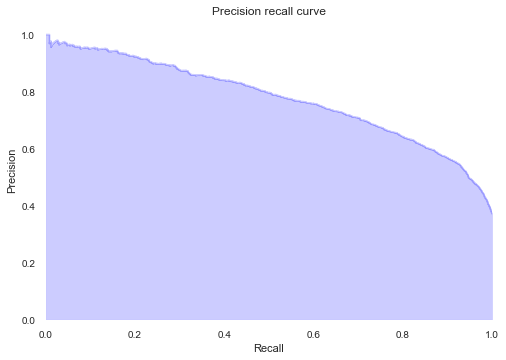

In [69]:
# Plot precision recall curve
precision, recall, thresholds = metrics.precision_recall_curve(y_test, proba[:,1])
plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision recall curve')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0]) 
plt.show()

In [70]:
# Print precision, recall and accuracy score
print('Precision : {0:0.3f}'.format(metrics.precision_score(y_test, predictions)))
print('Recall :', np.round(metrics.recall_score(y_test, predictions),3))
print('Accuracy : ',np.round(metrics.accuracy_score(y_test, predictions),3))

Precision : 0.729
Recall : 0.656
Accuracy :  0.785


In [71]:
param_test1 = {
    'max_depth':range(3,10,2),
    'min_child_weight':range(1,6,2), 
}
gsearch1 = GridSearchCV(estimator = XGBClassifier( learning_rate =0.1, n_estimators=140, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1, seed=27, verbose = 2), 
 param_grid = param_test1, scoring='roc_auc',n_jobs=-1,iid=False, cv=5)
gsearch1.fit(X_train,y_train)


C:\Users\beren\anaconda3\envs\TensorFlow-GPU\lib\site-packages\sklearn\model_selection\_search.py:823: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


GridSearchCV(cv=5, error_score=nan,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=0.8, gamma=0, gpu_id=None,
                                     importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=0.1, max_delta_step=None,
                                     max_depth=5, min_child_weight=1,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=140, n...
                                     objective='binary:logistic',
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, scale_pos_weight=1,
                                     seed=27, subsample=0.8, tree_meth

In [72]:
gsearch1.best_params_, gsearch1.best_score_

({'max_depth': 7, 'min_child_weight': 5}, 0.8611799085347819)

In [73]:
param_test2 = {
    'max_depth':[6,7,8],
    'min_child_weight':[4,5,6], 
    'gamma':[i/10.0 for i in range(0,5)]
}
gsearch2 = GridSearchCV(estimator = XGBClassifier( learning_rate =0.1, n_estimators=140, max_depth=7,
 min_child_weight=5, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1, seed=27), 
 param_grid = param_test2, scoring='roc_auc',n_jobs=-1,iid=False, cv=5)
gsearch2.fit(X_train,y_train)

C:\Users\beren\anaconda3\envs\TensorFlow-GPU\lib\site-packages\sklearn\model_selection\_search.py:823: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


GridSearchCV(cv=5, error_score=nan,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=0.8, gamma=0, gpu_id=None,
                                     importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=0.1, max_delta_step=None,
                                     max_depth=7, min_child_weight=5,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=140, n...
                                     objective='binary:logistic',
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, scale_pos_weight=1,
                                     seed=27, subsample=0.8, tree_meth

In [74]:
gsearch2.best_params_, gsearch2.best_score_

({'gamma': 0.1, 'max_depth': 6, 'min_child_weight': 6}, 0.8617159631468068)

In [75]:
xgb1 = XGBClassifier( learning_rate =0.1, n_estimators=140, max_depth=6,
 min_child_weight=6, gamma=0.1, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1, seed=27, verbosity = 0)

xgb1.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=0.1, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=6, missing=nan, monotone_constraints=None,
              n_estimators=140, n_jobs=4, nthread=4, num_parallel_tree=1,
              objective='binary:logistic', random_state=27, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, seed=27, subsample=0.8,
              tree_method=None, validate_parameters=False, verbosity=0)

In [76]:
# Prediction test labels
predictions = xgb1.predict(X_test)
proba = xgb1.predict_proba(X_test)
# Assess performance: ROC and AUC
fpr, tpr, _ = metrics.roc_curve(y_test, proba[:,1])
# Assess performance: ROC and AUC
fpr, tpr, _ = metrics.roc_curve(y_test, proba[:,1])
auc = metrics.auc(fpr, tpr)
print('Area under ROC =', np.round(auc, 2))

Area under ROC = 0.86


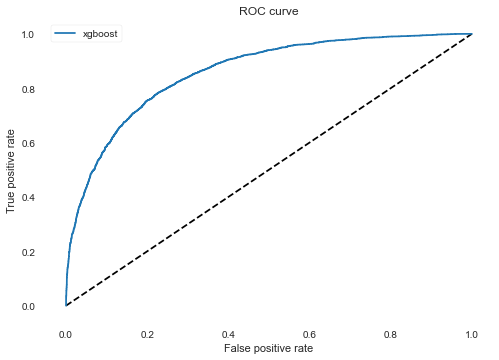

In [77]:
#Plot ROC
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='xgboost')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

RF confusion matrix:  [[5493  845]
 [1253 2409]]


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


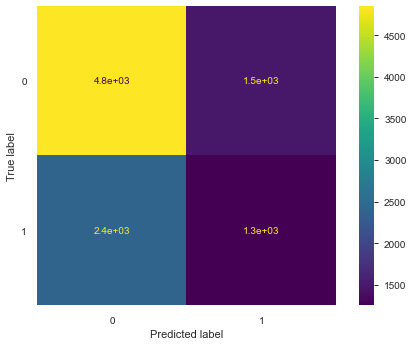

In [78]:
# Confusion matrix
confusion_matrix = metrics.confusion_matrix(y_test, predictions)
print('RF confusion matrix: ', confusion_matrix)
metrics.plot_confusion_matrix(rf, X_test, y_test)

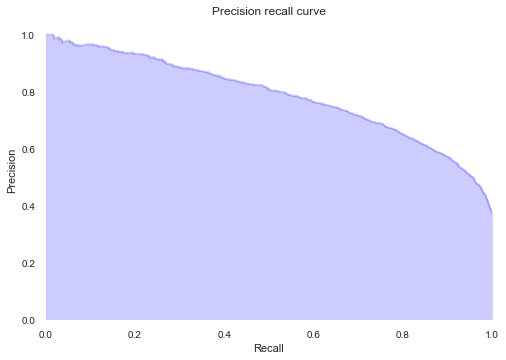

In [79]:
# Plot precision recall curve
precision, recall, thresholds = metrics.precision_recall_curve(y_test, proba[:,1])
plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision recall curve')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0]) 
plt.show()

In [80]:
# Print precision, recall and accuracy score
print('Precision : {0:0.3f}'.format(metrics.precision_score(y_test, predictions)))
print('Recall :', np.round(metrics.recall_score(y_test, predictions),3))
print('Accuracy : ',np.round(metrics.accuracy_score(y_test, predictions),3))

Precision : 0.740
Recall : 0.658
Accuracy :  0.79


In [81]:
# List of features for later use
feature_list = list(X.columns)
# Get numerical feature importances
importances = list(xgb1.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 4)) for feature, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances]

Variable: city-King's Landing  Importance: 0.3156999945640564
Variable: phone-iPhone         Importance: 0.21580000221729279
Variable: avg_rating_by_driver Importance: 0.1662999987602234
Variable: ultimate_black_user  Importance: 0.0851999968290329
Variable: surge_pct            Importance: 0.04960000142455101
Variable: weekday_pct          Importance: 0.03929999843239784
Variable: city-Winterfell      Importance: 0.035100001841783524
Variable: avg_surge            Importance: 0.02500000037252903
Variable: trips_in_first_30_days Importance: 0.024700000882148743
Variable: avg_rating_of_driver Importance: 0.017899999395012856
Variable: avg_dist             Importance: 0.014299999922513962
Variable: signup_delta         Importance: 0.011099999770522118


[None, None, None, None, None, None, None, None, None, None, None, None]

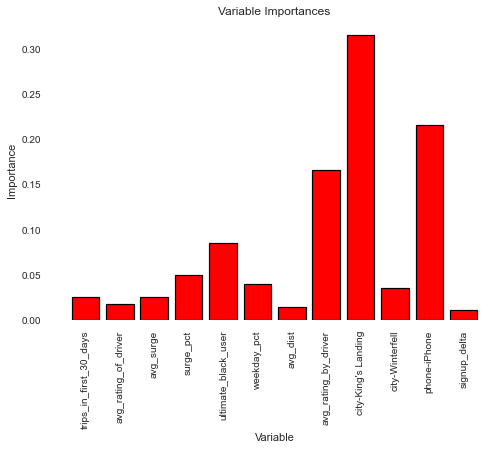

In [82]:
# list of x locations for plotting
x_values = list(range(len(importances)))
# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical', color = 'r', edgecolor = 'k', linewidth = 1.2)
# Tick labels for x axis
plt.xticks(x_values, feature_list, rotation='vertical')
# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

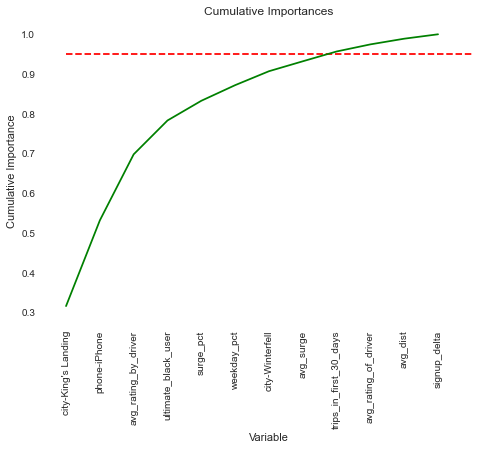

In [83]:
# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances]
sorted_features = [importance[0] for importance in feature_importances]
# Cumulative importances
cumulative_importances = np.cumsum(sorted_importances)
# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')
# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')
# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')
# Axis labels and title
plt.xlabel('Variable'); plt.ylabel('Cumulative Importance'); plt.title('Cumulative Importances');

Text(0, 0.5, 'Feature Importance Score')

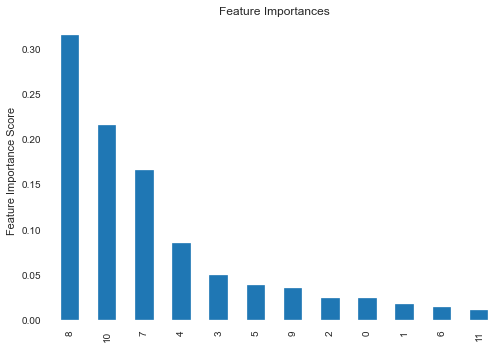

In [84]:
feat_imp = pd.Series(xgb1.feature_importances_).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Feature Importances')
plt.ylabel('Feature Importance Score')

### Conclusions

We started by using a simple logistic regression, then tried k Nearest Nieghbirs and a Random Forest. The best model was the random forest with an AUC of 0.85, precision of 0.73, recall of 0.64 and accuracy of 0.78.

We tried another ensemble method, xgboost, and gained a little bit more performance: the AUC went up to 0.86, precision and recall to 0.74 and 0.66, respectively.

The gain is small so we decided not to push further, but instead to focus on the feature importance for the last two models. Each model provided insights about important features.
* Random forest model: avg_rating_by_driver is the most important feature in predicting rider retention, followed by percentage of weekday rides and the user signup in King's Landing.
* XGBoost has a different order for feature importance: King's Landing users, then iPhone users are better predictors than the average rating by drivers

We will take a quick look at these features to offer suggestions to improve retention.

#### Average rating by driver:
We see that the average rating is slightly lower for active users. This might be due to the fact that they have more rides (so the ratings regress to the mean). Anyways it's hard to use this feature to address rider retention, especially with such small differences.

In [85]:
print("Average rating by driver for active users: ", np.round(clean_df.avg_rating_by_driver[clean_df.is_active == True].mean(), 2))
print("Average rating by driver for non-active users: ", np.round(clean_df.avg_rating_by_driver[clean_df.is_active == False].mean(), 2))

Average rating by driver for active users:  4.76
Average rating by driver for non-active users:  4.79


In [86]:
x1 = np.sort(clean_df.avg_rating_by_driver[clean_df.is_active == True])
n = x1.size
y1 = np.arange(1, n+1) / n

In [87]:
x2 = np.sort(clean_df.avg_rating_by_driver[clean_df.is_active == False])
n = x2.size
y2 = np.arange(1, n+1) / n

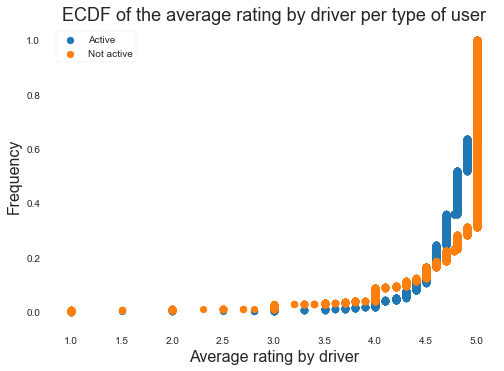

In [88]:
plt.scatter(x=x1, y=y1);plt.scatter(x=x2, y=y2);
plt.xlabel('Average rating by driver', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.title('ECDF of the average rating by driver per type of user', size = 18)
plt.legend(('Active', 'Not active'))

#### Percent weekday rides:
Active users have slightly more weekday rides. 

In addition, the ECDF indicates that non-active users are more often exclusively weekdays or weekend riders, whereas active users have their rides distributed more evenly between weekdays and weekend days. Targeting these week only/weekend only riders with adds/promotions could improve retention.

In [89]:
print("Average percent weekday rides for active users: ", np.round(clean_df.weekday_pct[clean_df.is_active == True].mean(), 2))
print("Average percent weekday rides for non-active users: ", np.round(clean_df.weekday_pct[clean_df.is_active == False].mean(), 2))

Average percent weekday rides for active users:  62.21
Average percent weekday rides for non-active users:  60.18


In [90]:
x1 = np.sort(clean_df.weekday_pct[clean_df.is_active == True])
n = x1.size
y1 = np.arange(1, n+1) / n

In [91]:
x2 = np.sort(clean_df.weekday_pct[clean_df.is_active == False])
n = x2.size
y2 = np.arange(1, n+1) / n

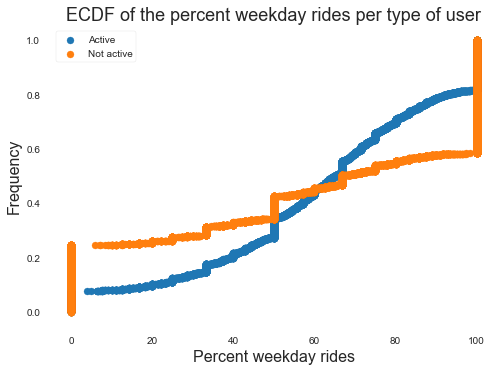

In [92]:
plt.scatter(x=x1, y=y1);plt.scatter(x=x2, y=y2);
plt.xlabel('Percent weekday rides', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.title('ECDF of the percent weekday rides per type of user', size = 18)
plt.legend(('Active', 'Not active'))

#### Signup location:
There are less active users in Astapor and Winterfell. Is there a competitior, or something else in these cities that prevents users to use the service (public transports, ease to have their own vehicle, slower service due to traffic, etc.)? Based on that, actions can be taken to increase user retention.

In [93]:
clean_df.city.unique()

array(["King's Landing", 'Astapor', 'Winterfell'], dtype=object)

In [94]:
KL = clean_df.is_active[clean_df.city == "King's Landing"]
As = clean_df.is_active[clean_df.city == "Astapor"]
Wint = clean_df.is_active[clean_df.city == "Winterfell"]

Text(0.5, 1.0, 'Stacked bars: activity per signup city')

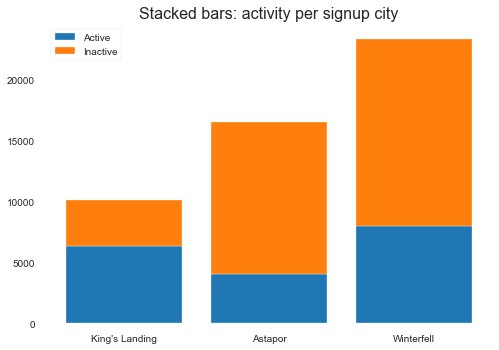

In [95]:
counts = [KL.count(), As.count(), Wint.count()]
active = [KL.sum(), As.sum(), Wint.sum()]
inactive = np.subtract(counts,active)

plt.bar(clean_df.city.unique(), height =active)
plt.bar(clean_df.city.unique(), height =inactive, bottom=active)
plt.legend(('Active', 'Inactive'))
plt.title('Stacked bars: activity per signup city', size = 16)

Text(0.5, 1.0, 'Normalized stacked bars: activity per signup city')

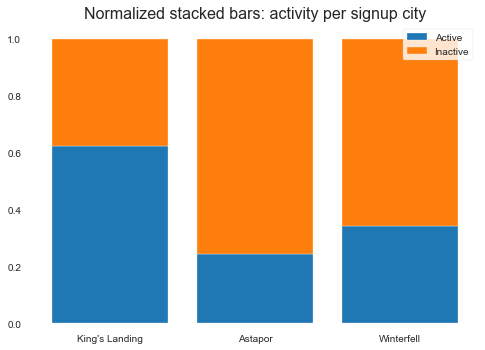

In [96]:
active_norm = np.divide(active,counts)
inactive_norm =  np.divide(inactive,counts)

plt.bar(clean_df.city.unique(), height =active_norm)
plt.bar(clean_df.city.unique(), height =inactive_norm, bottom=active_norm)
plt.legend(('Active', 'Inactive'))
plt.title('Normalized stacked bars: activity per signup city', size = 16)

#### Phone type:
iPhone users are more often active than Android users. Is the Android UX as good as iPhone users experience?

In [97]:
clean_df.phone.unique()

array(['iPhone', 'Android', nan], dtype=object)

In [98]:
iphone = clean_df.is_active[clean_df.phone == "iPhone"]
android = clean_df.is_active[clean_df.phone == "Android"]


Text(0.5, 1.0, 'Stacked bars: activity per type of device')

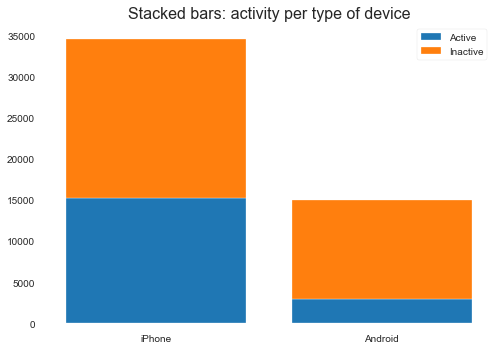

In [99]:
counts = [iphone.count(), android.count()]
active = [iphone.sum(), android.sum()]
inactive = np.subtract(counts,active)

plt.bar(['iPhone', 'Android'], height =active)
plt.bar(['iPhone', 'Android'], height =inactive, bottom=active)
plt.legend(('Active', 'Inactive'))
plt.title('Stacked bars: activity per type of device', size = 16)

Text(0.5, 1.0, 'Normalized stacked bars: activity per signup city')

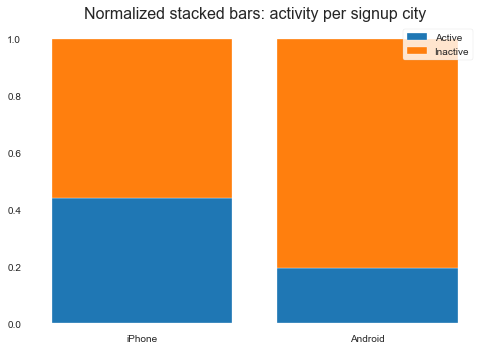

In [100]:
active_norm = np.divide(active,counts)
inactive_norm =  np.divide(inactive,counts)

plt.bar(['iPhone', 'Android'], height =active_norm)
plt.bar(['iPhone', 'Android'], height =inactive_norm, bottom=active_norm)
plt.legend(('Active', 'Inactive'))
plt.title('Normalized stacked bars: activity per signup city', size = 16)